1. Here I am trying to implement the [Real-Time Single Image and Video Super-Resolution Using an Efficient Sub-Pixel Convolutional Neural Network](http://https://arxiv.org/pdf/1609.05158.pdf) paper on diabetic retinopathy Images.

2. Here authors have proposed sub-pixel convolution layer which learns an array of upscaling filters to upscale the final Low Resolution feature maps into the High Resolution output. This effectively helps to eliminate bicubic filter in the Super Resolution pipeline with more complex upscaling filters specifically trained for each feature map, whilst also reducing the computational complexity of the overall Super Resolution operation. 

In [3]:
# Import all the necessary libraries

import tensorflow as tf

import os
import math
import numpy as np
import imageio
import cv2

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

### Define image data generators to load and preprocess the images

In [4]:
img_size = 512
downscale_factor = 4
input_size = img_size // downscale_factor
batch_size = 8
root_dir = '../input/dataset-drd/'

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(img_size, img_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(img_size, img_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 1415 files belonging to 3 classes.
Using 1132 files for training.
Found 1415 files belonging to 3 classes.
Using 283 files for validation.


### Normalize the pixels for training and validation images

In [5]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

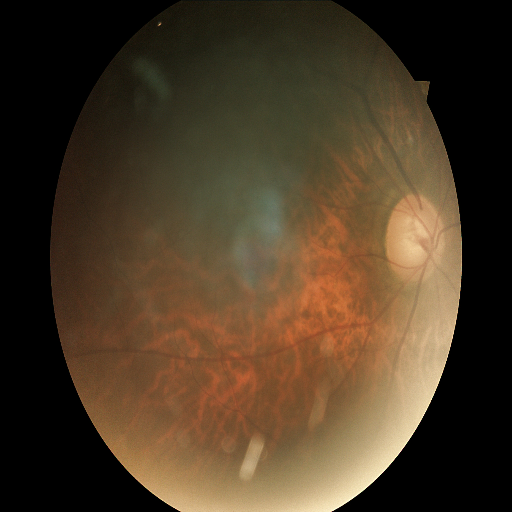

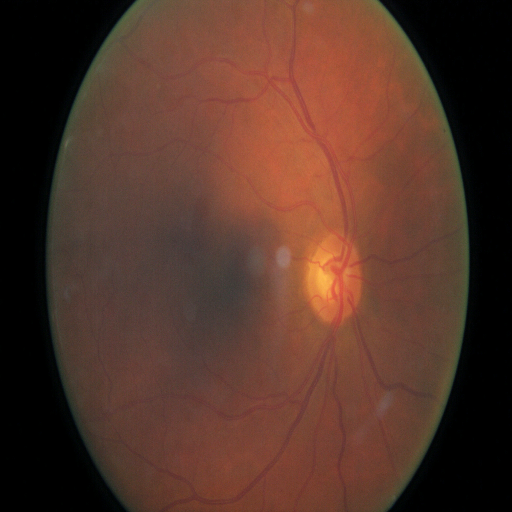

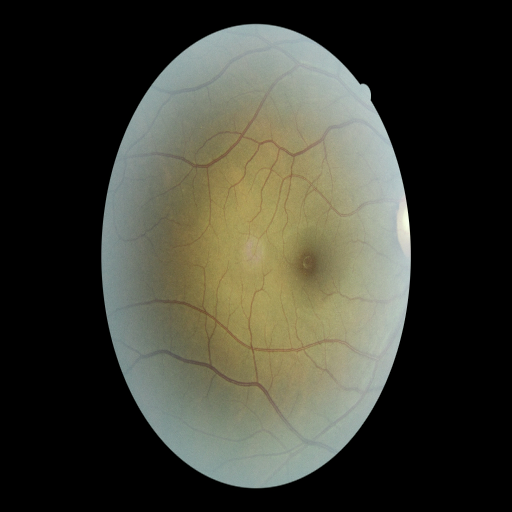

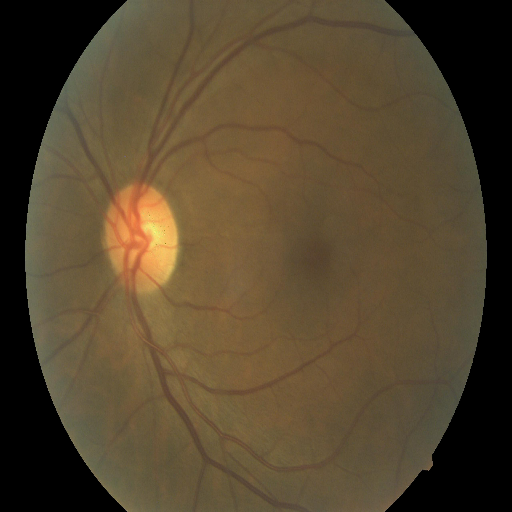

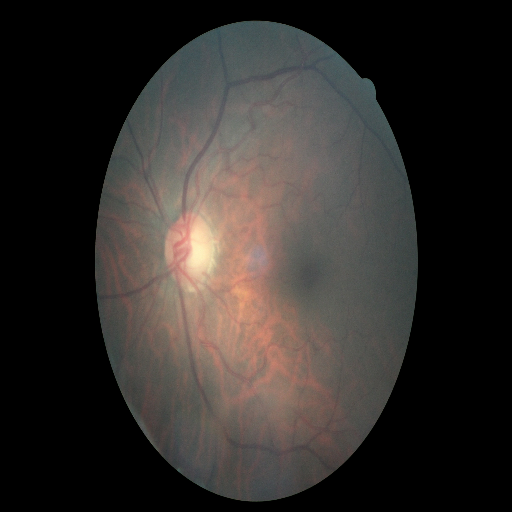

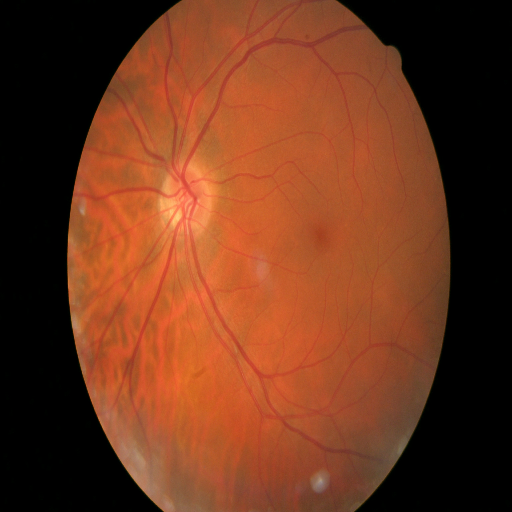

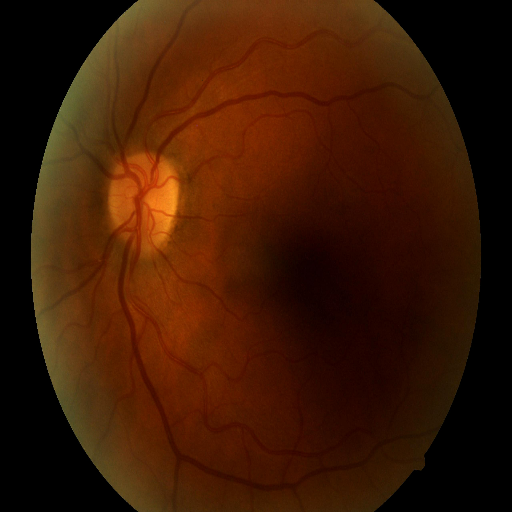

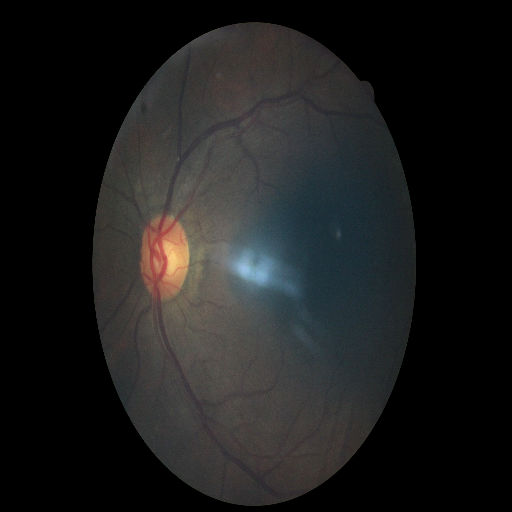

In [6]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

### Here we have prepared a dataset of test image paths that we will use for visual evaluation at the end of this example.

In [7]:
test_0_path = os.path.join(root_dir, "test/0/")

test_img_0_paths = sorted(
    [
        os.path.join(test_0_path, fname)
        for fname in os.listdir(test_0_path)
        if fname.endswith(".jpeg")
    ]
)


In [8]:
len(test_img_0_paths)

200

In [9]:
test_1_path = os.path.join(root_dir, "test/1")

test_img_1_paths = sorted(
    [
        os.path.join(test_1_path, fname)
        for fname in os.listdir(test_1_path)
        if fname.endswith(".jpeg")
    ]
)


In [10]:
len(test_img_1_paths)

203

### Here we define functions to process the input images.

1. First, we convert our images from the RGB color space to the YUV colour space.
2. We take input data (low-resolution images), we crop the image, retrieve the y channel (luninance), and resize it. We only consider the luminance channel in the YUV color space because humans are more sensitive to luminance change.
3. For the target data (high-resolution images), we just crop the image and retrieve the y channel.

In [11]:
# Use TF Ops to process.
def process_input(input, input_size, downscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, downscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, downscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

### Visualize input images after processing them. And we will also look into target images

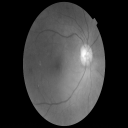

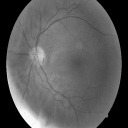

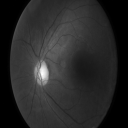

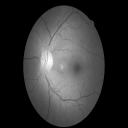

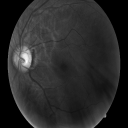

...

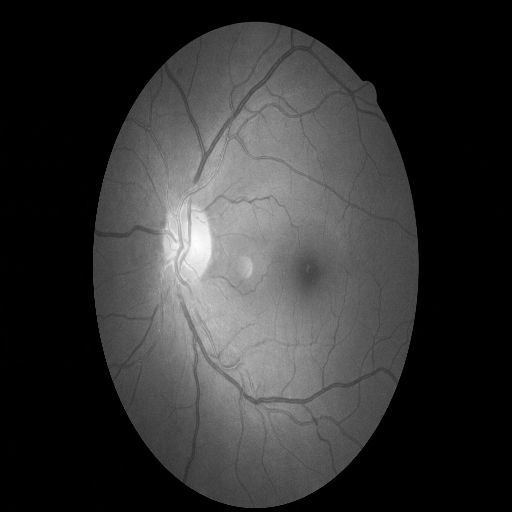

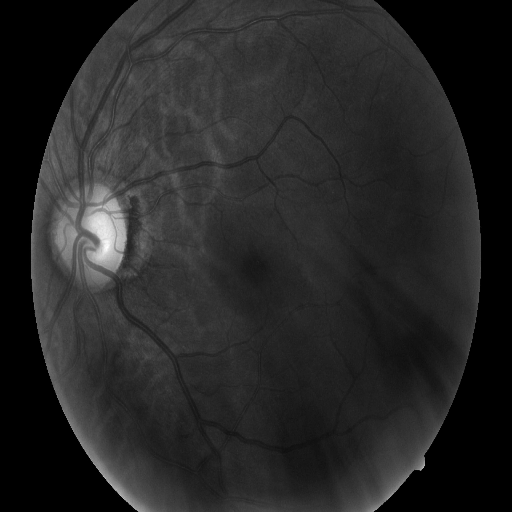

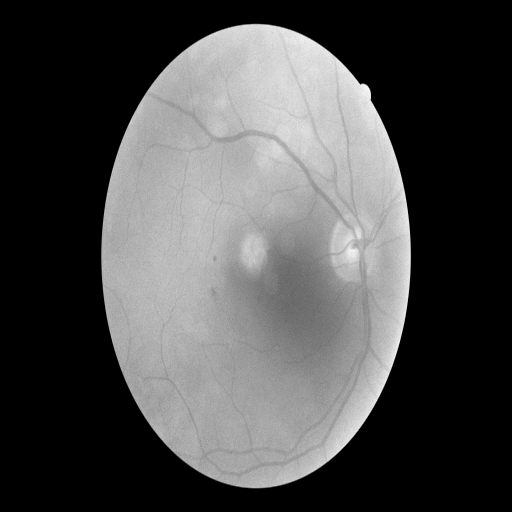

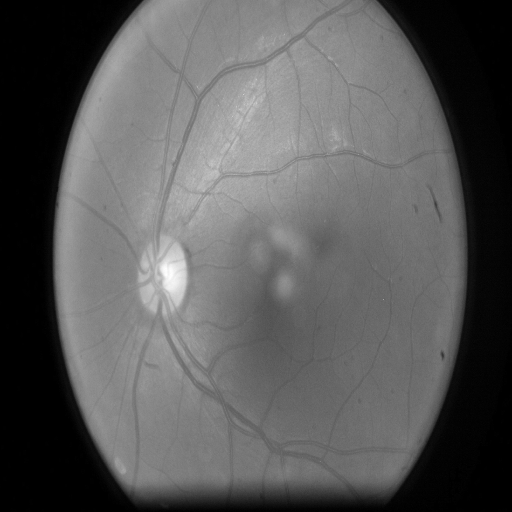

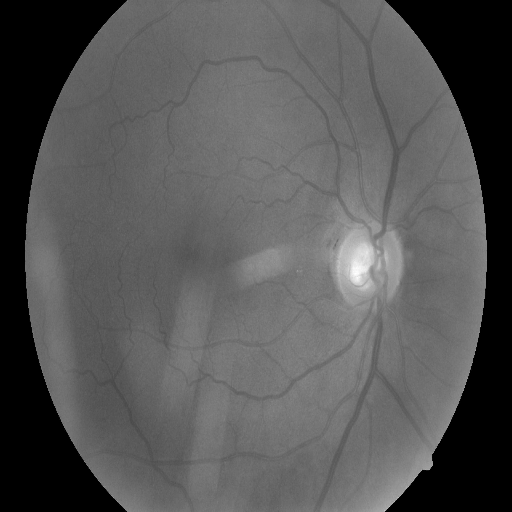

In [12]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

### Define Our CNN Model Architecture

In [13]:
def get_model(downscale_factor=4, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (downscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, downscale_factor)

    return keras.Model(inputs, outputs)

### Here we have defined some utility functions to monitor our results

1. plot_results to plot an save an image.
2. get_lowres_image to convert an image to its low-resolution version.
3. upscale_image to turn a low-resolution image to a high-resolution version reconstructed by the model. In this function, we use the y channel from the YUV color space as input to the model and then combine the output with the other channels to obtain an RGB image.

In [14]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    plt.show()


def get_lowres_image(img, downscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // downscale_factor, img.size[1] // downscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

### Here we have defined callbacks to monitor training

1. The ESPCNCallback object will compute and display the PSNR metric. 
2. This is the main metric we use to evaluate super-resolution performance.

In [15]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_0_paths[0]), downscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [16]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(downscale_factor=downscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 16)    4624      
_________________________________________________________________
tf.nn.depth_to_space (TFOpLa (None, None, None, 1)     0         
Total params: 61,680
Trainable params: 61,680
Non-trainable params: 0
_________________________________________________________

Epoch 1/100
142/142 - 92s - loss: 0.0054 - val_loss: 4.5616e-04
Mean PSNR for epoch: 33.53


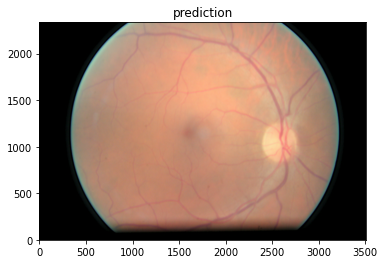

Epoch 2/100
142/142 - 65s - loss: 3.8117e-04 - val_loss: 3.2521e-04
Mean PSNR for epoch: 34.79
Epoch 3/100
142/142 - 64s - loss: 3.1135e-04 - val_loss: 4.3001e-04
Mean PSNR for epoch: 33.91
Epoch 4/100
142/142 - 64s - loss: 2.5329e-04 - val_loss: 2.2629e-04
Mean PSNR for epoch: 36.47
Epoch 5/100
142/142 - 64s - loss: 2.4291e-04 - val_loss: 2.3220e-04
Mean PSNR for epoch: 36.40
Epoch 6/100
142/142 - 63s - loss: 1.9070e-04 - val_loss: 1.8613e-04
Mean PSNR for epoch: 37.31
Epoch 7/100
142/142 - 65s - loss: 1.7274e-04 - val_loss: 1.7584e-04
Mean PSNR for epoch: 37.55
Epoch 8/100
142/142 - 64s - loss: 2.2274e-04 - val_loss: 1.6916e-04
Mean PSNR for epoch: 37.72
Epoch 9/100
142/142 - 64s - loss: 1.7309e-04 - val_loss: 1.5916e-04
Mean PSNR for epoch: 38.06
Epoch 10/100
142/142 - 64s - loss: 1.4828e-04 - val_loss: 1.5189e-04
Mean PSNR for epoch: 38.24
Epoch 11/100
142/142 - 64s - loss: 1.4663e-04 - val_loss: 1.4719e-04
Mean PSNR for epoch: 38.33
Epoch 12/100
142/142 - 64s - loss: 1.7355e-04 - 

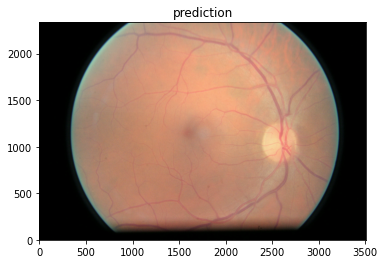

Epoch 22/100
142/142 - 62s - loss: 1.2085e-04 - val_loss: 1.2367e-04
Mean PSNR for epoch: 39.01
Epoch 23/100
142/142 - 63s - loss: 1.2560e-04 - val_loss: 1.8040e-04
Mean PSNR for epoch: 37.54
Epoch 24/100
142/142 - 64s - loss: 1.4665e-04 - val_loss: 1.4075e-04
Mean PSNR for epoch: 38.54
Epoch 25/100
142/142 - 65s - loss: 1.3293e-04 - val_loss: 1.2062e-04
Mean PSNR for epoch: 39.22
Epoch 26/100
142/142 - 64s - loss: 1.1495e-04 - val_loss: 1.1862e-04
Mean PSNR for epoch: 39.17
Epoch 27/100
142/142 - 63s - loss: 1.1472e-04 - val_loss: 1.2016e-04
Mean PSNR for epoch: 39.13
Epoch 28/100
142/142 - 64s - loss: 2.3204e-04 - val_loss: 2.5719e-04
Mean PSNR for epoch: 35.98
Epoch 29/100
142/142 - 64s - loss: 1.5599e-04 - val_loss: 1.2106e-04
Mean PSNR for epoch: 39.06
Epoch 30/100
142/142 - 64s - loss: 1.1576e-04 - val_loss: 1.1976e-04
Mean PSNR for epoch: 39.11
Epoch 31/100
142/142 - 63s - loss: 1.1420e-04 - val_loss: 1.1676e-04
Mean PSNR for epoch: 39.35
Epoch 32/100
142/142 - 61s - loss: 1.143

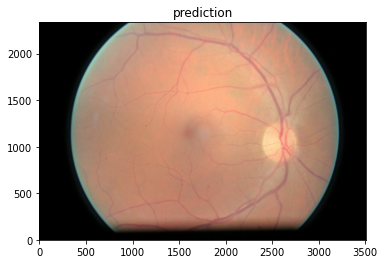

Epoch 42/100
142/142 - 63s - loss: 1.2127e-04 - val_loss: 1.1102e-04
Mean PSNR for epoch: 39.61
Epoch 43/100
142/142 - 63s - loss: 1.1398e-04 - val_loss: 1.1350e-04
Mean PSNR for epoch: 39.42
Epoch 44/100
142/142 - 63s - loss: 1.2135e-04 - val_loss: 1.2887e-04
Mean PSNR for epoch: 38.82
Epoch 45/100
142/142 - 63s - loss: 1.0675e-04 - val_loss: 1.1138e-04
Mean PSNR for epoch: 39.57
Epoch 46/100
142/142 - 63s - loss: 1.0865e-04 - val_loss: 1.0827e-04
Mean PSNR for epoch: 39.69
Epoch 47/100
142/142 - 63s - loss: 1.2268e-04 - val_loss: 1.1043e-04
Mean PSNR for epoch: 39.42
Epoch 48/100
142/142 - 63s - loss: 1.0945e-04 - val_loss: 1.3085e-04
Mean PSNR for epoch: 38.76
Epoch 49/100
142/142 - 62s - loss: 1.1972e-04 - val_loss: 1.0730e-04
Mean PSNR for epoch: 39.75
Epoch 50/100
142/142 - 63s - loss: 1.0390e-04 - val_loss: 1.0915e-04
Mean PSNR for epoch: 39.69
Epoch 51/100
142/142 - 62s - loss: 1.6870e-04 - val_loss: 1.1496e-04
Mean PSNR for epoch: 39.38
Epoch 52/100
142/142 - 60s - loss: 1.066

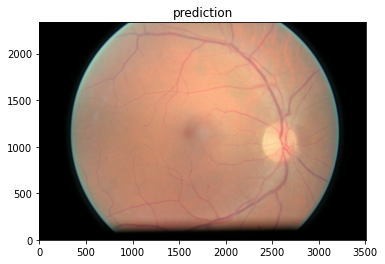

Epoch 62/100
142/142 - 62s - loss: 1.0125e-04 - val_loss: 1.0389e-04
Mean PSNR for epoch: 39.76
Epoch 63/100
142/142 - 62s - loss: 1.0397e-04 - val_loss: 1.0253e-04
Mean PSNR for epoch: 39.79
Epoch 64/100
142/142 - 64s - loss: 1.0090e-04 - val_loss: 1.0333e-04
Mean PSNR for epoch: 39.78
Epoch 65/100
142/142 - 62s - loss: 1.0220e-04 - val_loss: 1.0434e-04
Mean PSNR for epoch: 39.70
Epoch 66/100
142/142 - 63s - loss: 2.8944e-04 - val_loss: 2.4407e-04
Mean PSNR for epoch: 36.39
Epoch 67/100
142/142 - 62s - loss: 1.4669e-04 - val_loss: 1.1897e-04
Mean PSNR for epoch: 39.32
Epoch 68/100
142/142 - 63s - loss: 1.0692e-04 - val_loss: 1.0686e-04
Mean PSNR for epoch: 39.60
Epoch 69/100
142/142 - 63s - loss: 1.0268e-04 - val_loss: 1.0587e-04
Mean PSNR for epoch: 39.92
Epoch 70/100
142/142 - 63s - loss: 1.0102e-04 - val_loss: 1.0350e-04
Mean PSNR for epoch: 39.79
Epoch 71/100
142/142 - 63s - loss: 9.9774e-05 - val_loss: 1.0290e-04
Mean PSNR for epoch: 39.77
Epoch 72/100
142/142 - 62s - loss: 1.006

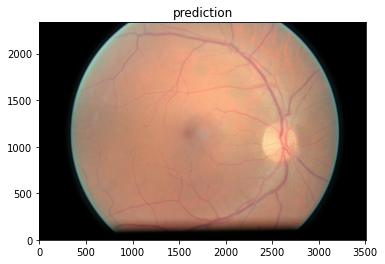

Epoch 82/100
142/142 - 63s - loss: 9.8726e-05 - val_loss: 9.9010e-05
Mean PSNR for epoch: 39.95
Epoch 83/100
142/142 - 63s - loss: 9.5965e-05 - val_loss: 9.8297e-05
Mean PSNR for epoch: 40.03
Epoch 84/100
142/142 - 62s - loss: 9.6321e-05 - val_loss: 9.9020e-05
Mean PSNR for epoch: 40.00
Epoch 85/100
142/142 - 59s - loss: 1.0750e-04 - val_loss: 9.9123e-05
Mean PSNR for epoch: 40.00
Epoch 86/100
142/142 - 62s - loss: 1.5455e-04 - val_loss: 0.0010
Mean PSNR for epoch: 29.94
Epoch 87/100
142/142 - 63s - loss: 1.2951e-04 - val_loss: 1.0306e-04
Mean PSNR for epoch: 39.85
Epoch 88/100
142/142 - 62s - loss: 9.8864e-05 - val_loss: 1.0038e-04
Mean PSNR for epoch: 40.06
Epoch 89/100
142/142 - 63s - loss: 9.7789e-05 - val_loss: 1.0014e-04
Mean PSNR for epoch: 39.85
Epoch 90/100
142/142 - 65s - loss: 9.7078e-05 - val_loss: 9.9573e-05
Mean PSNR for epoch: 39.98
Epoch 91/100
142/142 - 63s - loss: 9.6230e-05 - val_loss: 9.9101e-05
Mean PSNR for epoch: 39.91
Epoch 92/100
142/142 - 62s - loss: 2.1841e-0

In [17]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

### Now we run the model prediction and plot the results

In [18]:
os.mkdir('./HR_0_imgs')
os.mkdir('./SR_0_imgs')

In [19]:
os.mkdir('./HR_1_imgs')
os.mkdir('./SR_1_imgs')

PSNR of low resolution image and high resolution image is 41.6042
PSNR of predict and high resolution is 40.0555


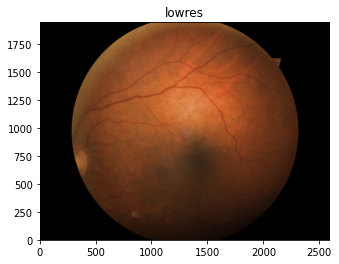

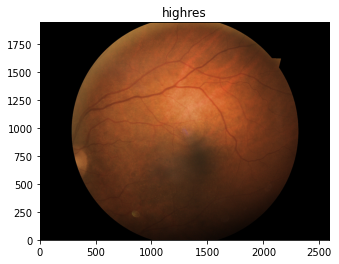

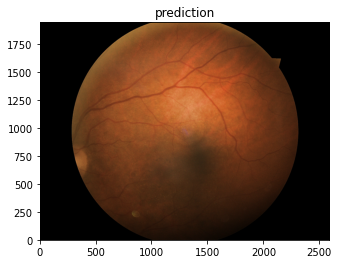

PSNR of low resolution image and high resolution image is 41.4159
PSNR of predict and high resolution is 39.7735


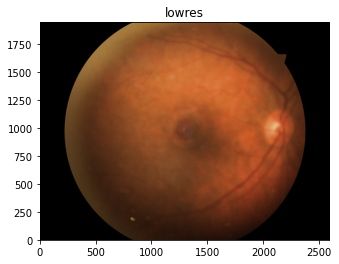

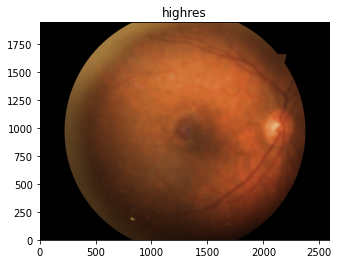

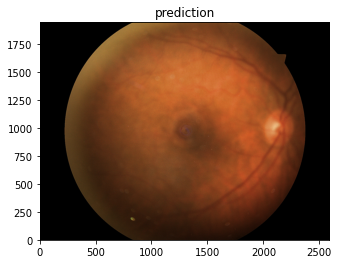

PSNR of low resolution image and high resolution image is 38.9685
PSNR of predict and high resolution is 39.5077


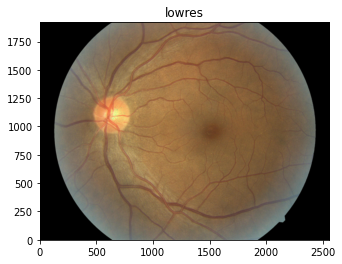

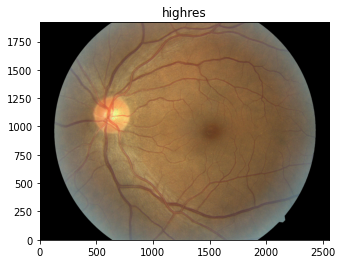

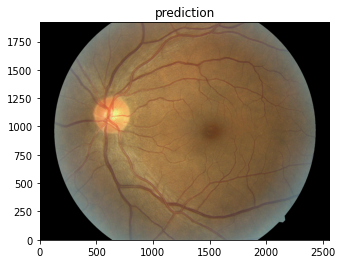

PSNR of low resolution image and high resolution image is 39.5554
PSNR of predict and high resolution is 39.5592


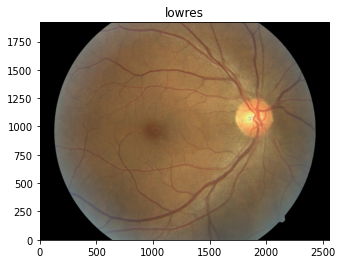

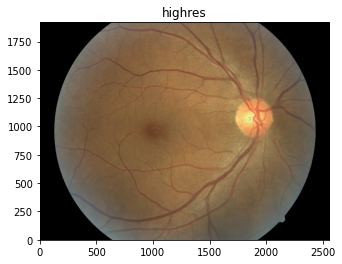

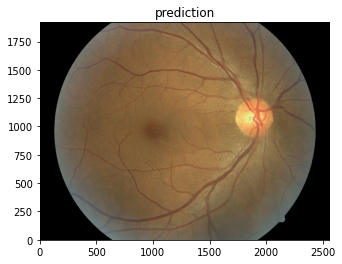

PSNR of low resolution image and high resolution image is 44.6922
PSNR of predict and high resolution is 41.9249


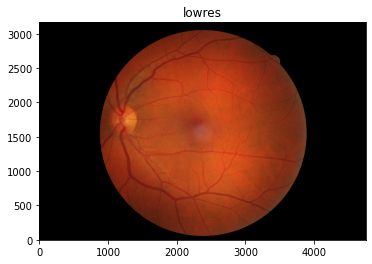

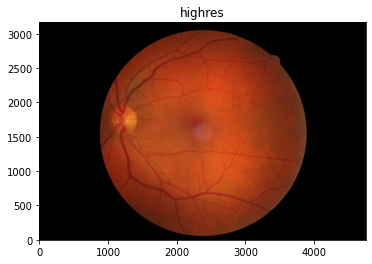

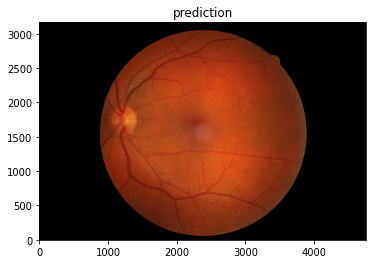

PSNR of low resolution image and high resolution image is 44.6572
PSNR of predict and high resolution is 41.8669


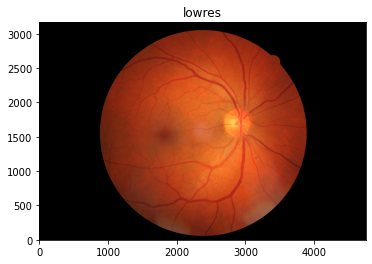

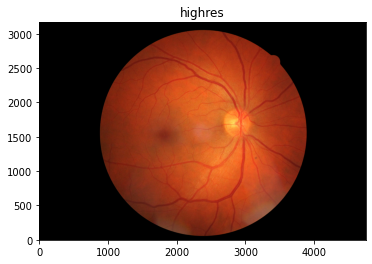

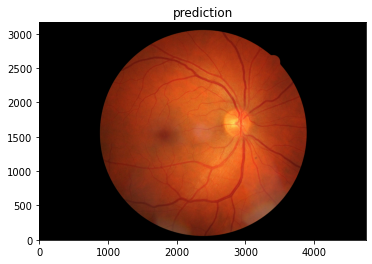

PSNR of low resolution image and high resolution image is 41.4507
PSNR of predict and high resolution is 38.9159


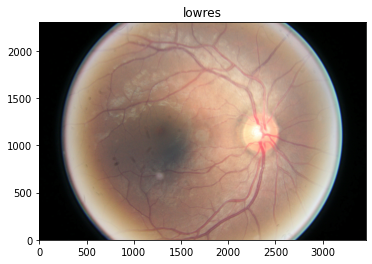

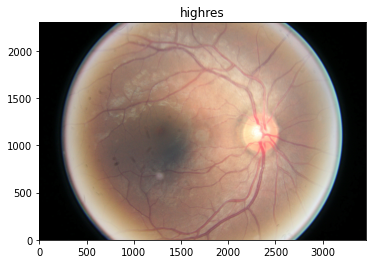

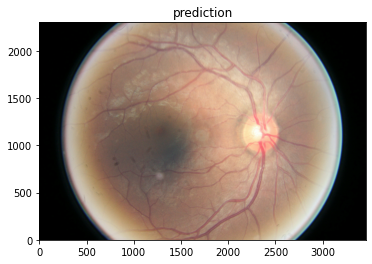

PSNR of low resolution image and high resolution image is 42.3803
PSNR of predict and high resolution is 39.3618


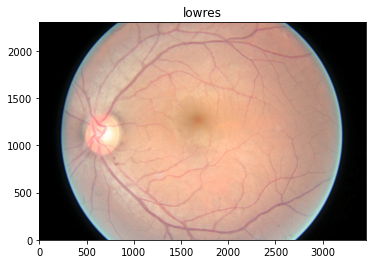

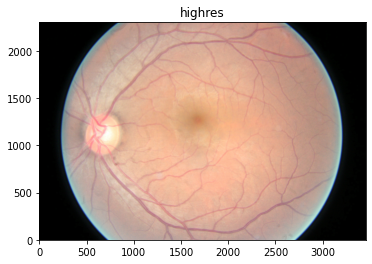

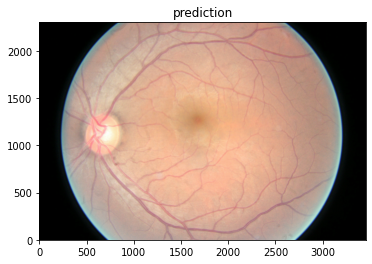

PSNR of low resolution image and high resolution image is 36.8894
PSNR of predict and high resolution is 38.9067


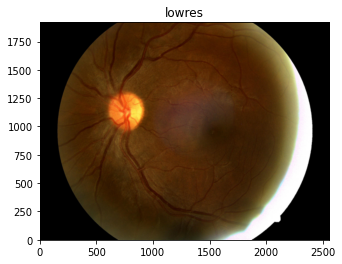

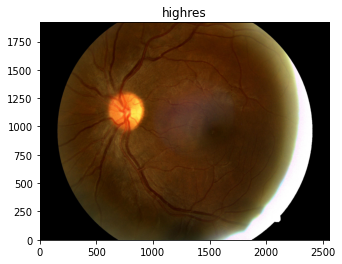

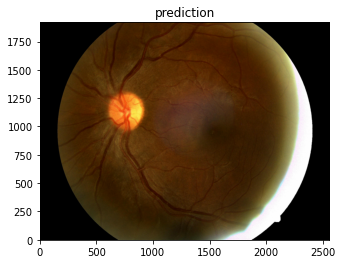

PSNR of low resolution image and high resolution image is 43.6774
PSNR of predict and high resolution is 41.3838


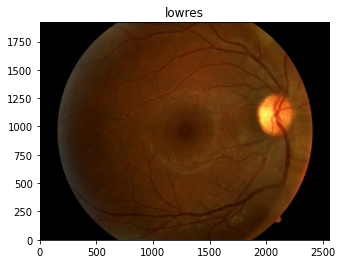

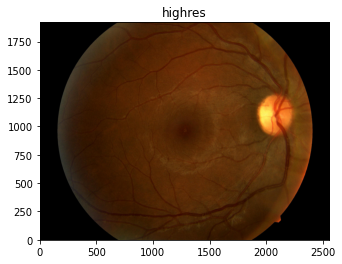

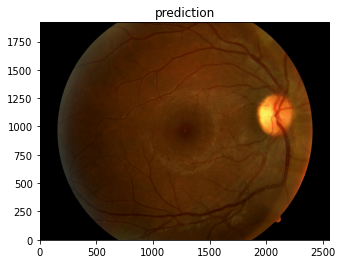

Avg. PSNR of lowres images is 41.5291
Avg. PSNR of reconstructions is 40.1256


In [35]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_0_paths[35:45]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, downscale_factor)
    w = lowres_input.size[0] * downscale_factor
    h = lowres_input.size[1] * downscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    
#     highres_img = cv2.resize(np.float32(highres_img), (512, 512), interpolation = cv2.INTER_NEAREST)
#     prediction = cv2.resize(np.float32(prediction), (512, 512), interpolation = cv2.INTER_NEAREST)
    
#     imageio.imwrite('./SR_0_imgs/SR_'+str(index+1)+'.jpeg', np.asarray(prediction, dtype=float))
#     imageio.imwrite('./HR_0_imgs/HR_'+str(index+1)+'.jpeg', np.asarray(highres_img, dtype=float))
    
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

PSNR of low resolution image and high resolution image is 44.4270
PSNR of predict and high resolution is 41.6612


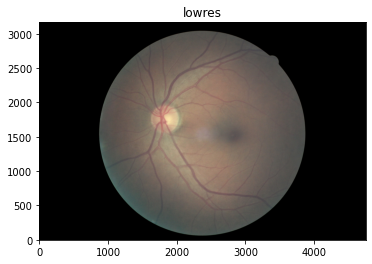

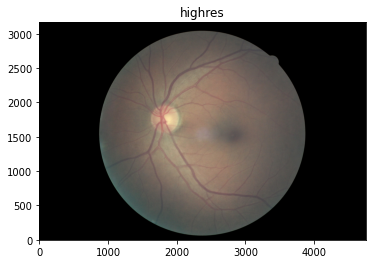

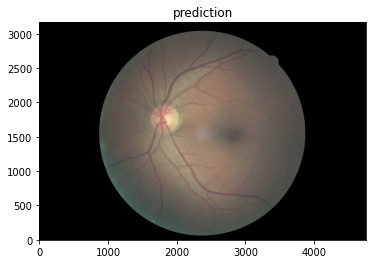

PSNR of low resolution image and high resolution image is 44.3281
PSNR of predict and high resolution is 41.5058


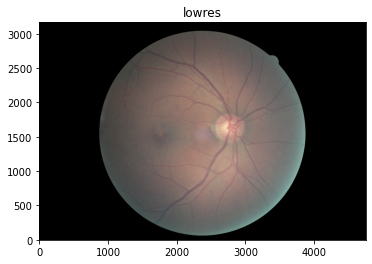

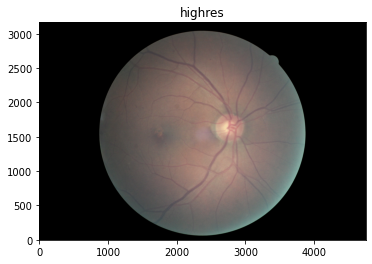

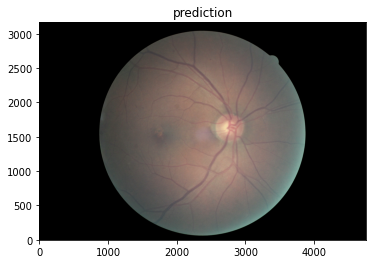

PSNR of low resolution image and high resolution image is 43.8650
PSNR of predict and high resolution is 41.2747


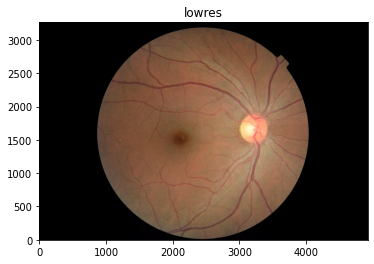

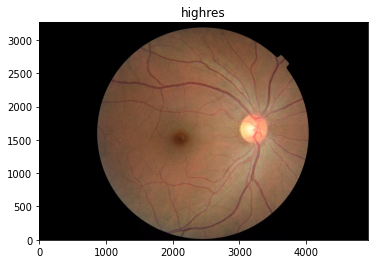

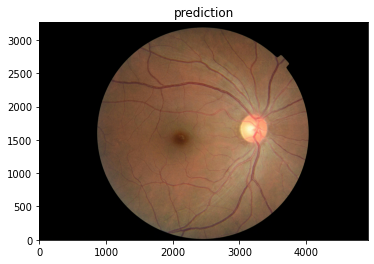

PSNR of low resolution image and high resolution image is 45.3838
PSNR of predict and high resolution is 42.3540


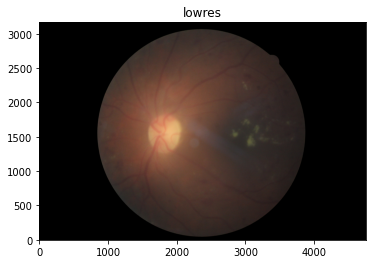

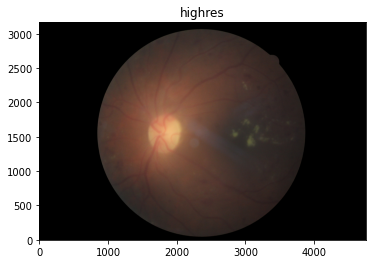

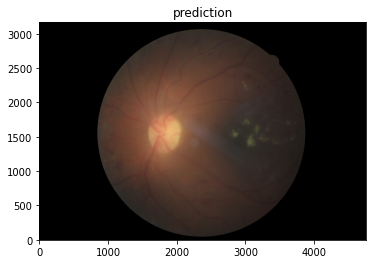

PSNR of low resolution image and high resolution image is 45.6444
PSNR of predict and high resolution is 42.4946


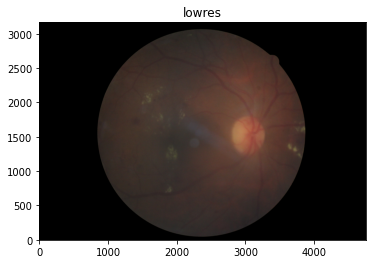

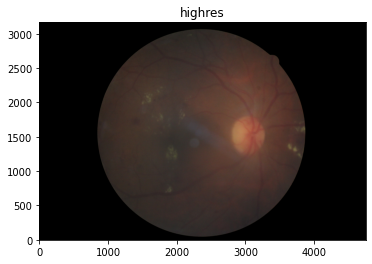

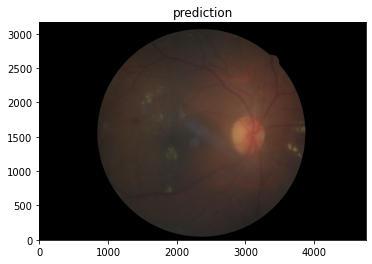

PSNR of low resolution image and high resolution image is 46.2468
PSNR of predict and high resolution is 42.7448


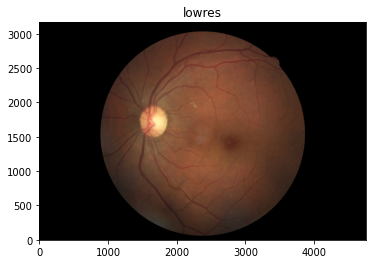

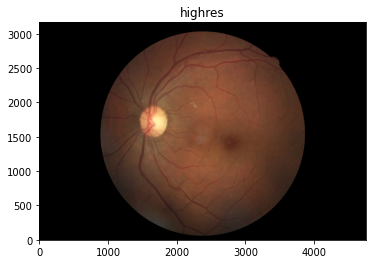

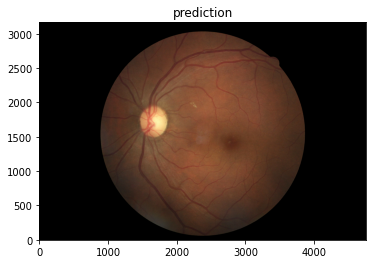

PSNR of low resolution image and high resolution image is 46.4599
PSNR of predict and high resolution is 42.8272


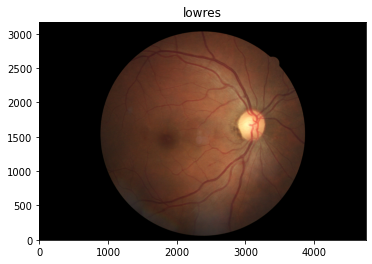

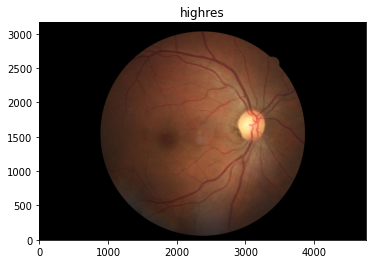

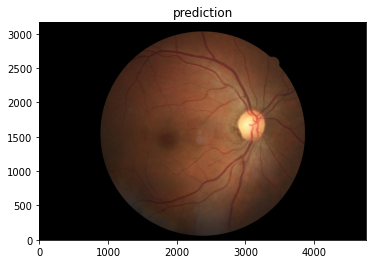

PSNR of low resolution image and high resolution image is 45.5058
PSNR of predict and high resolution is 40.9798


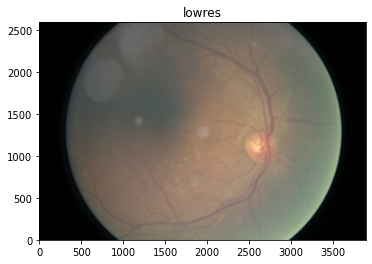

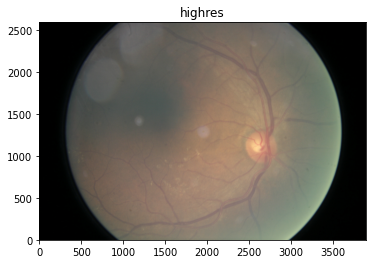

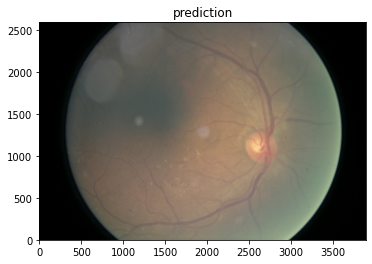

PSNR of low resolution image and high resolution image is 45.5081
PSNR of predict and high resolution is 41.0444


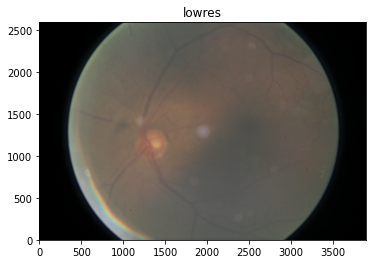

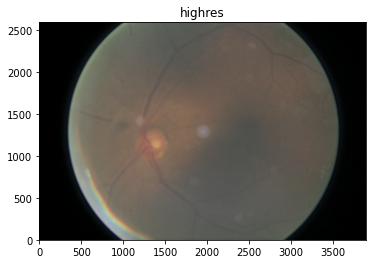

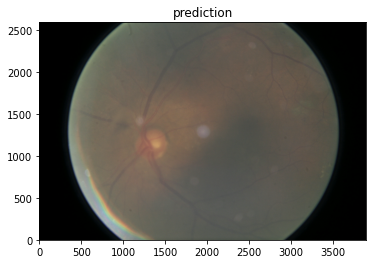

PSNR of low resolution image and high resolution image is 44.9292
PSNR of predict and high resolution is 42.0056


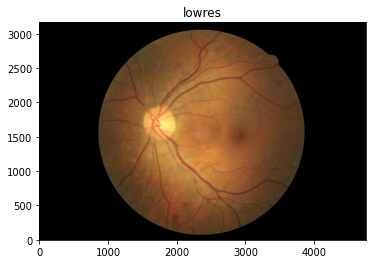

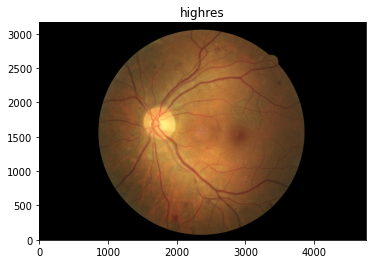

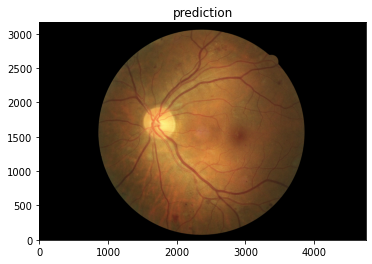

Avg. PSNR of lowres images is 45.2298
Avg. PSNR of reconstructions is 41.8892


In [34]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_1_paths[35:45]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, downscale_factor)
    w = lowres_input.size[0] * downscale_factor
    h = lowres_input.size[1] * downscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    
#     highres_img = cv2.resize(np.float32(highres_img), (512, 512), interpolation = cv2.INTER_NEAREST)
#     prediction = cv2.resize(np.float32(prediction), (512, 512), interpolation = cv2.INTER_NEAREST)
    
#     imageio.imwrite('./SR_1_imgs/SR_'+str(index+1)+'.jpeg', np.asarray(prediction, dtype=float))
#     imageio.imwrite('./HR_1_imgs/HR_'+str(index+1)+'.jpeg', np.asarray(highres_img, dtype=float))
    
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

In [29]:
# %%!

# zip -r HR_0_imgs.zip ./HR_0_imgs

In [30]:
# %%!

# zip -r SR_0_imgs.zip ./SR_0_imgs

In [31]:
# %%!

# zip -r HR_1_imgs.zip ./HR_1_imgs

In [32]:
# %%!

# zip -r SR_1_imgs.zip ./SR_1_imgs